# Checkpoint: K-means & Hierarchical Clustering 

## Ali LAMINE

This case requires developing a customer segmentation to define marketing strategy. The sample Dataset summarizes the usage behavior of about 9000 active credit cardholders during the last 6 months. The file is at a customer level with 18 behavioral variables.

Following is the data dictionary for credit card dataset :

CUST_ID: Identification of credit cardholder (Categorical)

BALANCE: Balance amount left in their account to make purchases 

BALANCE_FREQUENCY : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)) 

PURCHASES: Amount of purchases made from the account

ONEOFF_PURCHASES: Maximum purchase amount done in once

INSTALLMENTS_PURCHASES: Amount of purchase done in installments

CASH_ADVANCE: Cash in advance given by the user

PURCHASES_FREQUENCY: How frequently the purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)

ONEOFFPURCHASESFREQUENCY: How frequently purchases are happening at once (1 = frequently purchased, 0 = not frequently purchased)

PURCHASESINSTALLMENTSFREQUENCY: How frequently purchases in installments are being made (1 = frequently done, 0 = not frequently done)

CASHADVANCEFREQUENCY: How frequently the cash in advance is being paid 

CASHADVANCETRX: Number of transactions made with "Cash in Advance" 

PURCHASES_TRX: Number of purchase transactions made

CREDIT_LIMIT: Limit of credit card for user 

PAYMENTS: Amount of payment done by user

MINIMUM_PAYMENTS: Minimum amount of payments made by user 

PRCFULLPAYMENT: Percent of full payment paid by user

TENURE: Tenure of credit card service for user

## 1. Load your dataset. 

In [1]:
# import libraries 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
data= pd.read_csv("C:/Users/LENOVO/Desktop/CC GENERAL.csv")

In [3]:
data.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [4]:
# Dropping CUST-ID column
data=data.drop(["CUST_ID"], axis=1)

In [5]:
# Dropping missing values 
df=data.dropna(axis=0, how="any")

In [6]:
df.isnull().sum().sum()

0

## 2. Use hierarchical clustering to identify the inherent groupings within your data.

In [15]:
from sklearn.cluster import AgglomerativeClustering #Importing our clustering algorithm : Agglomerative
model=AgglomerativeClustering(n_clusters=3, affinity='manhattan', linkage='complete')
clust_labels=model.fit_predict(df)  #Applying agglomerative algorithm with 3 clusters, using manhattan distance as a metric

In [16]:
agglomerative=pd.DataFrame(clust_labels)
agglomerative

,0
0,0
1,0
2,0
3,0
4,0
...,...
8631,0
8632,0
8633,0
8634,0


## 3. Plot the clusters.

### Plotting agglomerative algorithm with 3 clusters, using manhattan distance as a metric

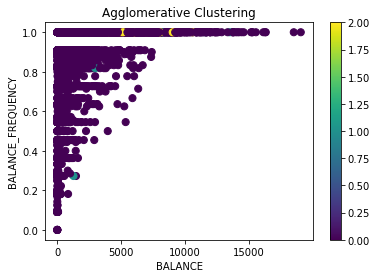

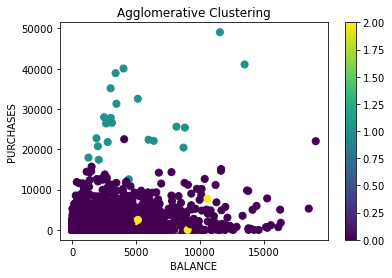

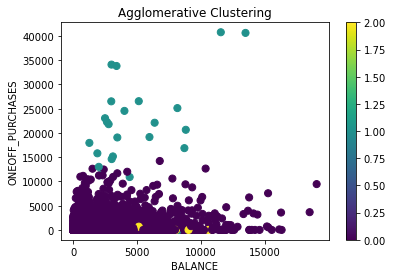

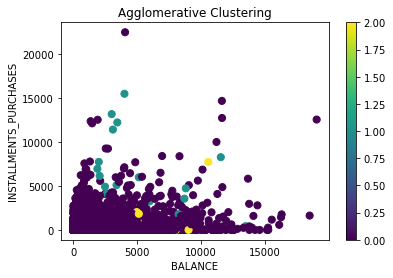

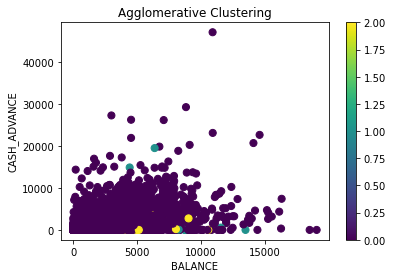

...

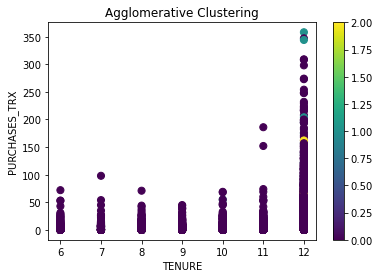

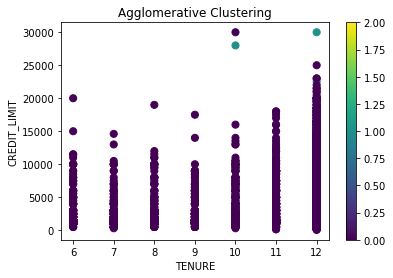

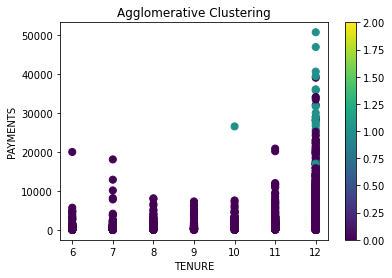

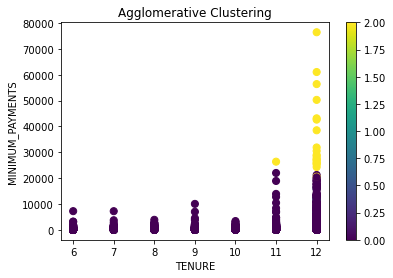

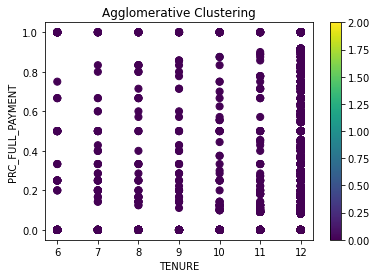

In [18]:
import matplotlib.pyplot as plt
for col1 in df.columns:
    for col2 in df.columns:
        if col1!=col2:
            fig =plt.figure()
            ax = fig.add_subplot(111)
            scatter = ax.scatter (df [col1] , df [col2], c= agglomerative[0], s=50)
            ax.set_title("Agglomerative Clustering")
            ax.set_xlabel(col1)
            ax.set_ylabel(col2)
            plt.colorbar(scatter)

It seems that the best figure we got with 3 distinctive clusters were with Minimum_payments and:
- Purchases
- ONEOFF_Purchases
- Payments
- Installements_Purchases

Let's look on these variables more closely!!!! 

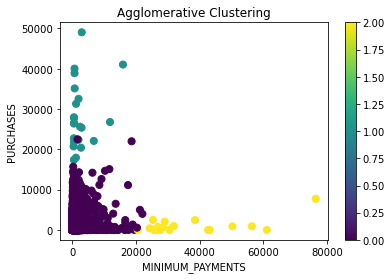

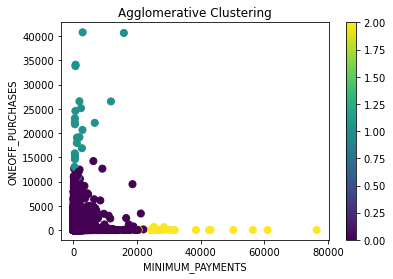

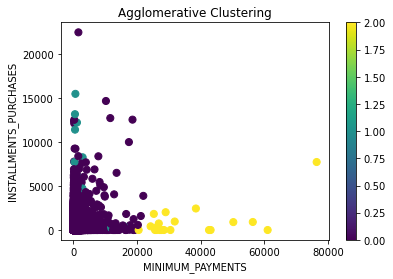

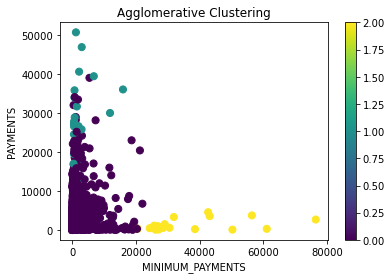

In [19]:
import matplotlib.pyplot as plt
L=["PURCHASES","ONEOFF_PURCHASES","INSTALLMENTS_PURCHASES","PAYMENTS"]
for i in L:
    fig =plt.figure()
    ax = fig.add_subplot(111)
    scatter = ax.scatter (df ["MINIMUM_PAYMENTS"] , df [i], c= agglomerative[0], s=50)
    ax.set_title("Agglomerative Clustering")
    ax.set_xlabel("MINIMUM_PAYMENTS")
    ax.set_ylabel(i)
    plt.colorbar(scatter)

With Hierarchical Clustering, we can divide our customers in 3 groups:

1- customers who pay less expensive purchases at once with a low minimum_payments

2- customers who pay more expensive purchases at once with a low minimum_payments

3- customers who pay less expensive purchases at once with a high minimum_payments

### Plotting agglomerative algorithm with 3 clusters, using euclidean distance as a metric

In [20]:
from sklearn.cluster import AgglomerativeClustering #Importing our clustering algorithm : Agglomerative
model=AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='complete')
clust_labels=model.fit_predict(df)  #Applying agglomerative algorithm with 3 clusters, using euclidean distance as a metric

In [21]:
agglomerative=pd.DataFrame(clust_labels)
agglomerative

,0
0,0
1,0
2,0
3,0
4,0
...,...
8631,0
8632,0
8633,0
8634,0


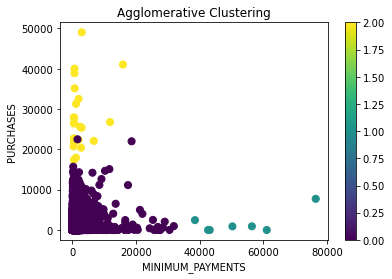

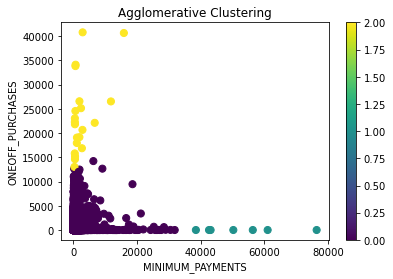

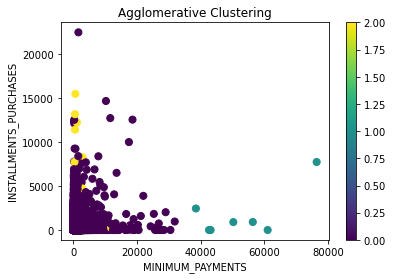

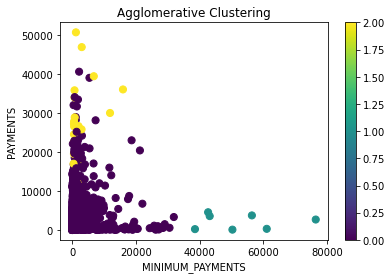

In [23]:
import matplotlib.pyplot as plt
L=["PURCHASES","ONEOFF_PURCHASES","INSTALLMENTS_PURCHASES","PAYMENTS"]
for i in L:
    fig =plt.figure()
    ax = fig.add_subplot(111)
    scatter = ax.scatter (df ["MINIMUM_PAYMENTS"] , df [i], c= agglomerative[0], s=50)
    ax.set_title("Agglomerative Clustering")
    ax.set_xlabel("MINIMUM_PAYMENTS")
    ax.set_ylabel(i)
    plt.colorbar(scatter)

Same result as manhattan distance!!!

### Plotting agglomerative algorithm with 4 clusters, using euclidean distance as a metric

In [24]:
from sklearn.cluster import AgglomerativeClustering #Importing our clustering algorithm : Agglomerative
model=AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='complete')
clust_labels=model.fit_predict(df)  #Applying agglomerative algorithm with 3 clusters, using manhattan distance as a metric
agglomerative=pd.DataFrame(clust_labels)
agglomerative

,0
0,2
1,2
2,2
3,2
4,2
...,...
8631,2
8632,2
8633,2
8634,2


No obvious 4 clusters!!! 3 clusters are enough!!!!

## 4. Plot the dendrogram. 

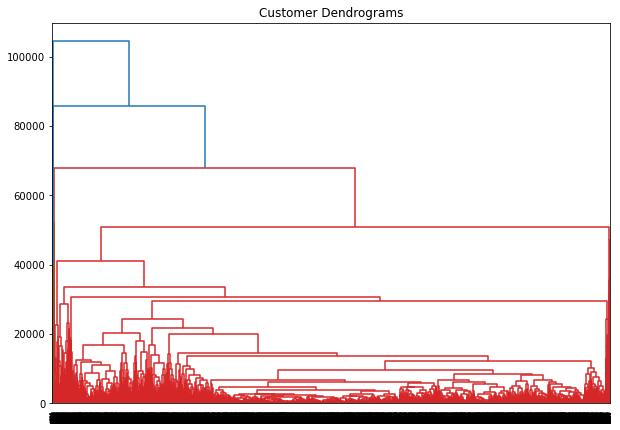

In [26]:
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10,7))
plt.title("Customer Dendrograms")
dend=shc.dendrogram(shc.linkage(df, method="complete"))

## 5. Use K-means clustering and Try different K values and select the best one. 

### Kmeans=3

In [27]:
df=data.dropna(axis=0, how="any")
#df.head()

In [28]:
from sklearn.cluster import KMeans  #Importing our clustering algorithm: KMeans
kmeans=KMeans(n_clusters=3, random_state=0)  #Cluster our data by choosing 3 as number of clusters
kmeans.fit(df)

KMeans(n_clusters=3, random_state=0)

In [29]:
labels=pd.DataFrame(kmeans.labels_)
labels

,0
0,0
1,1
2,1
3,0
4,0
...,...
8631,0
8632,0
8633,0
8634,0


In [30]:
kmeans.predict(df)
print(kmeans.cluster_centers_)   #Printing the coordinates of cluster centers.

[[8.80233831e+02 8.76238663e-01 6.19308425e+02 3.20828367e+02
  2.98790606e+02 5.01090106e+02 4.73605565e-01 1.57647263e-01
  3.56352248e-01 1.08839886e-01 2.29673307e+00 1.09207968e+01
  2.75735834e+03 1.03446490e+03 5.73275623e+02 1.64154097e-01
  1.14551394e+01]
 [3.43875402e+03 9.46574261e-01 1.59917567e+03 9.95813221e+02
  6.03683217e+02 2.13780053e+03 5.43841991e-01 3.18608883e-01
  3.90002784e-01 2.13230023e-01 5.82930108e+00 2.24435484e+01
  9.02320992e+03 2.95407354e+03 1.58635616e+03 1.35393151e-01
  1.17396953e+01]
 [4.87916214e+03 9.17611326e-01 1.08536936e+04 7.65950163e+03
  3.19436248e+03 5.19215982e+03 7.57564000e-01 6.03537062e-01
  6.08805682e-01 2.28296233e-01 9.27131783e+00 8.68604651e+01
  1.24848837e+04 1.80309572e+04 2.52779839e+03 3.37066930e-01
  1.18372093e+01]]


In [31]:
df.insert(2,'label', labels[0])
#df.head()

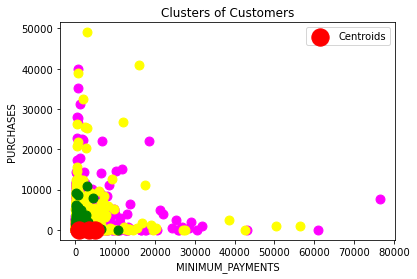

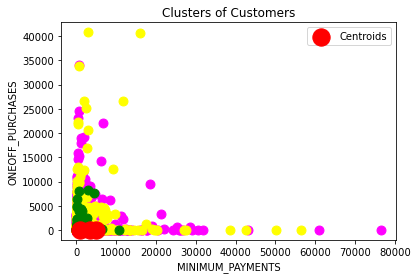

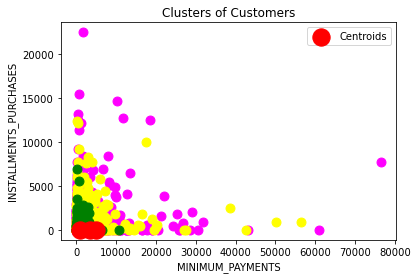

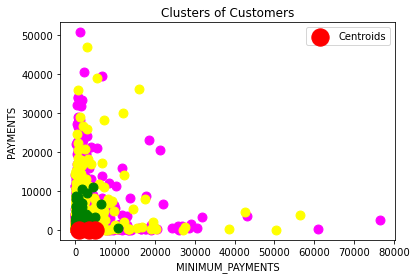

In [32]:
L=["PURCHASES","ONEOFF_PURCHASES","INSTALLMENTS_PURCHASES","PAYMENTS"]
for i in L:
    plt.scatter(df ["MINIMUM_PAYMENTS"][df.label == 0],          
                df[i][df.label == 0],s=80,c='magenta')
    plt.scatter(df ["MINIMUM_PAYMENTS"][df.label == 1],          
                df[i][df.label == 1],s=80,c='yellow')
    plt.scatter(df ["MINIMUM_PAYMENTS"][df.label == 2],          
                df[i][df.label == 2],s=80,c='green')
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red', label = 'Centroids')
    plt.title('Clusters of Customers')
    plt.xlabel("MINIMUM_PAYMENTS")
    plt.ylabel(i)
    plt.legend()
    plt.show()

### Kmeans=4

In [33]:
df=data.dropna(axis=0, how="any")
#df.head()

In [34]:
from sklearn.cluster import KMeans  #Importing our clustering algorithm: KMeans
kmeans=KMeans(n_clusters=4, random_state=0)  #Cluster our data by choosing 4 as number of clusters
kmeans.fit(df)

KMeans(n_clusters=4, random_state=0)

In [35]:
labels=pd.DataFrame(kmeans.labels_)
labels

,0
0,1
1,0
2,0
3,1
4,1
...,...
8631,1
8632,1
8633,1
8634,1


In [36]:
kmeans.predict(df)
print(kmeans.cluster_centers_)   #Printing the coordinates of cluster centers.

[[2.06819475e+03 9.20405184e-01 1.41752983e+03 8.86130294e+02
  5.31784386e+02 1.07828789e+03 5.63082765e-01 3.21656112e-01
  3.90081672e-01 1.42581697e-01 3.44060389e+00 2.01056814e+01
  7.52202478e+03 2.03970347e+03 7.68300470e+02 1.80516743e-01
  1.17405642e+01]
 [8.39084236e+02 8.75515777e-01 5.37917853e+02 2.64811706e+02
  2.73405597e+02 4.97927529e+02 4.59965363e-01 1.37339523e-01
  3.52313131e-01 1.11772277e-01 2.34558824e+00 9.96507353e+00
  2.28379361e+03 9.56909709e+02 6.04257656e+02 1.54835112e-01
  1.14139706e+01]
 [5.51904482e+03 9.59636360e-01 2.62568628e+04 2.10020188e+04
  5.25484400e+03 1.49196450e+03 9.12666640e-01 8.08666720e-01
  7.31999960e-01 5.99999600e-02 2.44000000e+00 1.23320000e+02
  1.61600000e+04 2.84337129e+04 3.22200380e+03 4.97424240e-01
  1.19200000e+01]
 [5.99378840e+03 9.57288436e-01 2.60707901e+03 1.57173199e+03
  1.03548303e+03 4.77924211e+03 5.21633702e-01 3.07761133e-01
  4.10418200e-01 3.36285306e-01 1.09143731e+01 3.35290520e+01
  1.11498540e+04

In [37]:
df.insert(2,'label', labels[0])
#df.head()

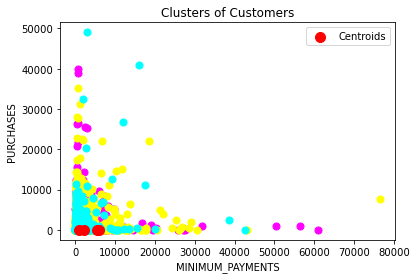

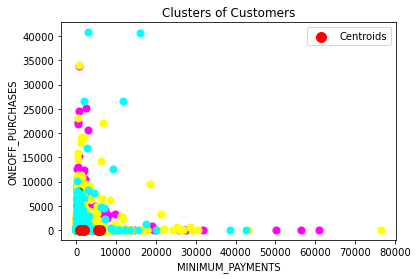

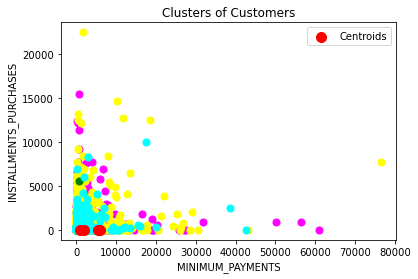

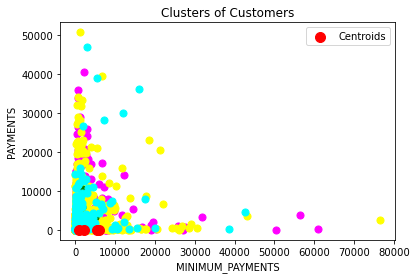

In [38]:
L=["PURCHASES","ONEOFF_PURCHASES","INSTALLMENTS_PURCHASES","PAYMENTS"]
for i in L:
    plt.scatter(df ["MINIMUM_PAYMENTS"][df.label == 0],          
                df[i][df.label == 0],s=50,c='magenta')
    plt.scatter(df ["MINIMUM_PAYMENTS"][df.label == 1],          
                df[i][df.label == 1],s=50,c='yellow')
    plt.scatter(df ["MINIMUM_PAYMENTS"][df.label == 2],          
                df[i][df.label == 2],s=50,c='green')
    plt.scatter(df ["MINIMUM_PAYMENTS"][df.label == 3],          
                df[i][df.label == 3],s=50,c='cyan')
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=100, c='red', label = 'Centroids')
    plt.title('Clusters of Customers')
    plt.xlabel("MINIMUM_PAYMENTS")
    plt.ylabel(i)
    plt.legend()
    plt.show()

### Kmeans=2

In [39]:
df=data.dropna(axis=0, how="any")
#df.head()

In [40]:
from sklearn.cluster import KMeans  #Importing our clustering algorithm: KMeans
kmeans=KMeans(n_clusters=2, random_state=0)  #Cluster our data by choosing 2 as number of clusters
kmeans.fit(df)

KMeans(n_clusters=2, random_state=0)

In [41]:
labels=pd.DataFrame(kmeans.labels_)
labels

,0
0,1
1,0
2,1
3,1
4,1
...,...
8631,1
8632,1
8633,1
8634,1


In [42]:
kmeans.predict(df)
print(kmeans.cluster_centers_)   #Printing the coordinates of cluster centers.

[[3.90479615e+03 9.45320269e-01 2.42324901e+03 1.58714753e+03
  8.36502106e+02 2.63848702e+03 5.63396973e-01 3.49249946e-01
  4.11887757e-01 2.30618646e-01 6.71118350e+00 2.86427796e+01
  9.88930757e+03 4.39770599e+03 1.80258348e+03 1.51684407e-01
  1.17453855e+01]
 [9.76677019e+02 8.81401720e-01 6.46456029e+02 3.38593328e+02
  3.08149525e+02 5.48367196e+02 4.77727227e-01 1.67045847e-01
  3.57143841e-01 1.12385982e-01 2.39284663e+00 1.13433912e+01
  3.06692281e+03 1.07597563e+03 6.09917384e+02 1.61369359e-01
  1.14771858e+01]]


In [43]:
df.insert(2,'label', labels[0])
#df.head()

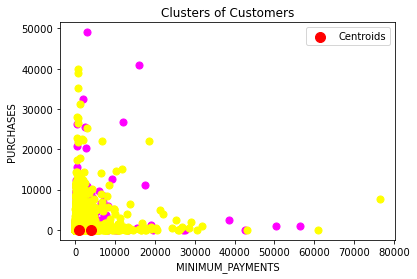

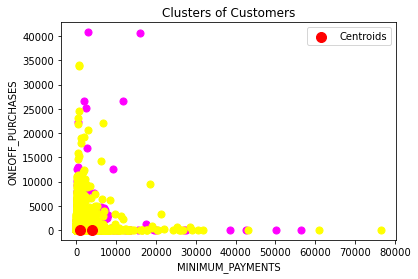

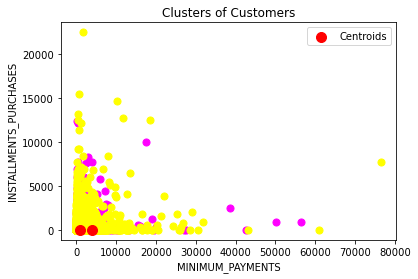

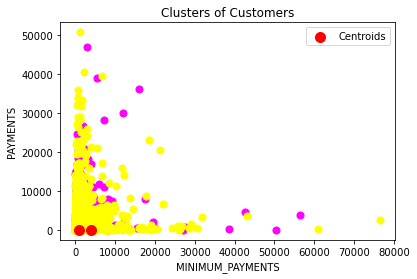

In [44]:
L=["PURCHASES","ONEOFF_PURCHASES","INSTALLMENTS_PURCHASES","PAYMENTS"]
for i in L:
    plt.scatter(df ["MINIMUM_PAYMENTS"][df.label == 0],          
                df[i][df.label == 0],s=50,c='magenta')
    plt.scatter(df ["MINIMUM_PAYMENTS"][df.label == 1],          
                df[i][df.label == 1],s=50,c='yellow')
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=100, c='red', label = 'Centroids')
    plt.title('Clusters of Customers')
    plt.xlabel("MINIMUM_PAYMENTS")
    plt.ylabel(i)
    plt.legend()
    plt.show()

Bad clustering!!!!!!

Maybe we should consider standardization from the beginning 

[[-0.36980098 -0.17044319 -0.23352488 -0.20457684 -0.17604836 -0.31199758
  -0.05958495 -0.23363208 -0.04813876 -0.33599084 -0.30117379 -0.24510819
  -0.34298554 -0.28765999 -0.13965419  0.01561121 -0.02519338]
 [ 0.30332304  0.41987159  1.51168289  1.26371701  1.25122055 -0.24909419
   1.13337888  1.53916362  0.95735143 -0.36449691 -0.25460127  1.66768723
   0.88894685  0.82440776  0.15794244  0.47229807  0.29533849]
 [ 1.15191885  0.31393058 -0.29540954 -0.2118566  -0.30916994  1.36313684
  -0.65466082 -0.31629935 -0.56120484  1.5425362   1.32680929 -0.37283751
   0.59761138  0.44011841  0.40139768 -0.42448233 -0.13433865]]


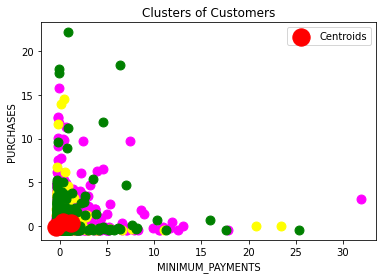

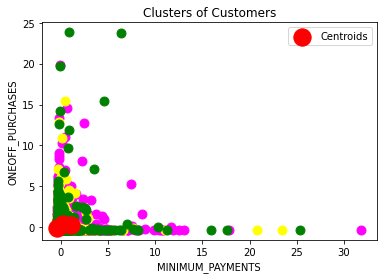

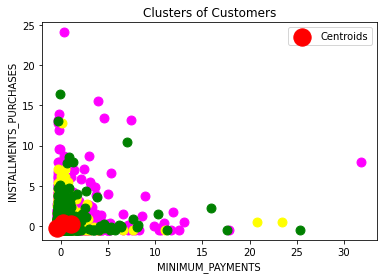

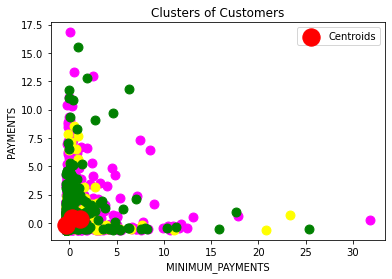

In [48]:
# Standardization
df=data.dropna(axis=0, how="any")
std=df[:]
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaled_values = scaler.fit_transform(std) 
std.loc[:,:] = scaled_values
from sklearn.cluster import KMeans  #Importing our clustering algorithm: KMeans
kmeans=KMeans(n_clusters=3, random_state=0)  #Cluster our data by choosing 3 as number of clusters
kmeans.fit(std)
labels=pd.DataFrame(kmeans.labels_)
labels
kmeans.predict(std)
print(kmeans.cluster_centers_)   #Printing the coordinates of cluster centers.
std.insert(2,'label', labels[0])
L=["PURCHASES","ONEOFF_PURCHASES","INSTALLMENTS_PURCHASES","PAYMENTS"]
for i in L:
    plt.scatter(std ["MINIMUM_PAYMENTS"][std.label == 0],          
                std[i][std.label == 0],s=80,c='magenta')
    plt.scatter(std ["MINIMUM_PAYMENTS"][std.label == 1],          
                std[i][std.label == 1],s=80,c='yellow')
    plt.scatter(std ["MINIMUM_PAYMENTS"][std.label == 2],          
                std[i][std.label == 2],s=80,c='green')
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red', label = 'Centroids')
    plt.title('Clusters of Customers')
    plt.xlabel("MINIMUM_PAYMENTS")
    plt.ylabel(i)
    plt.legend()
    plt.show()

Standardization didn't fix the problem!!!

Let's determine the best K for the K-means, with the Elbow method then with the Silhouette Coefficients 

#### Elbow Method

In [49]:
# Standardization 
df=data.dropna(axis=0, how="any")
std=df[:]
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaled_values = scaler.fit_transform(df) 
std.loc[:,:] = scaled_values

from sklearn.cluster import KMeans  #Importing our clustering algorithm: KMeans
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 0
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(std)
    sse.append(kmeans.inertia_)

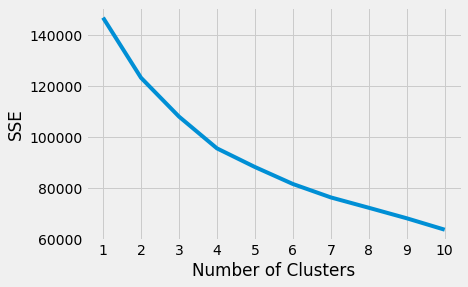

In [50]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [51]:
from kneed import KneeLocator
kl = KneeLocator(range(1, 11), sse, curve="convex", direction="decreasing")
kl.elbow

4

#### Silhouette Coefficients 

In [52]:
from sklearn.metrics import silhouette_score
# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(std)
    score = silhouette_score(scaled_values, kmeans.labels_)
    silhouette_coefficients.append(score)

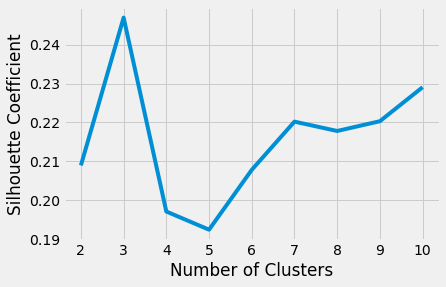

In [53]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients)
plt.xticks(range(2, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

The Elbow Method showed that k=4 is the optimum while The Silhouette Coefficients showed that the optimum is 3.

It's controversial!!!

## 6. Plot the clusters. 

Let's try to replot the clusters with k=3!!!!

[[-0.36980098 -0.17044319 -0.23352488 -0.20457684 -0.17604836 -0.31199758
  -0.05958495 -0.23363208 -0.04813876 -0.33599084 -0.30117379 -0.24510819
  -0.34298554 -0.28765999 -0.13965419  0.01561121 -0.02519338]
 [ 0.30332304  0.41987159  1.51168289  1.26371701  1.25122055 -0.24909419
   1.13337888  1.53916362  0.95735143 -0.36449691 -0.25460127  1.66768723
   0.88894685  0.82440776  0.15794244  0.47229807  0.29533849]
 [ 1.15191885  0.31393058 -0.29540954 -0.2118566  -0.30916994  1.36313684
  -0.65466082 -0.31629935 -0.56120484  1.5425362   1.32680929 -0.37283751
   0.59761138  0.44011841  0.40139768 -0.42448233 -0.13433865]]


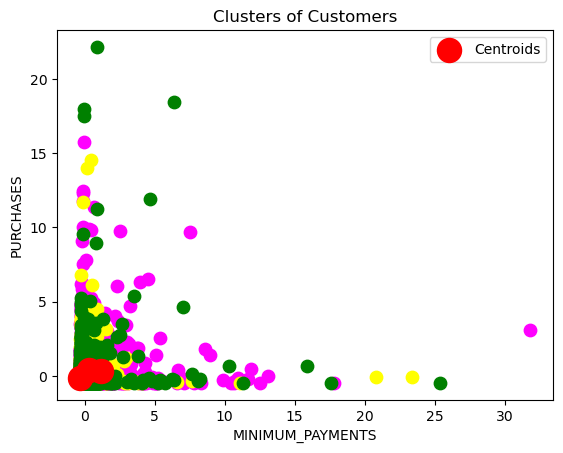

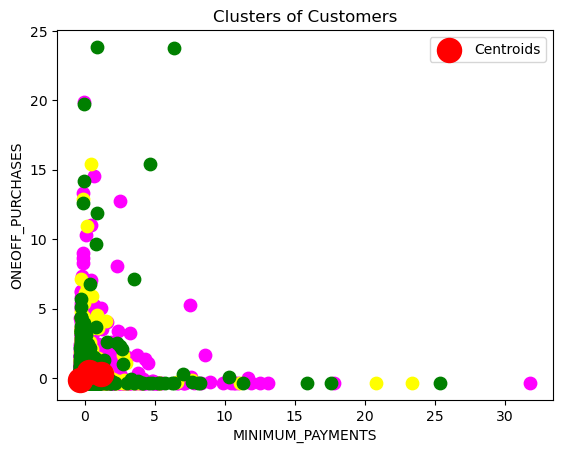

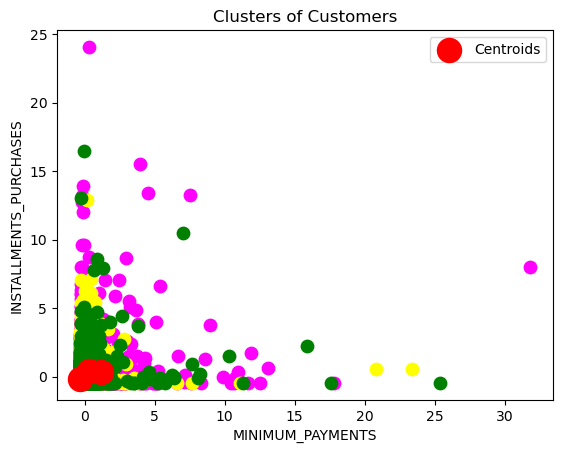

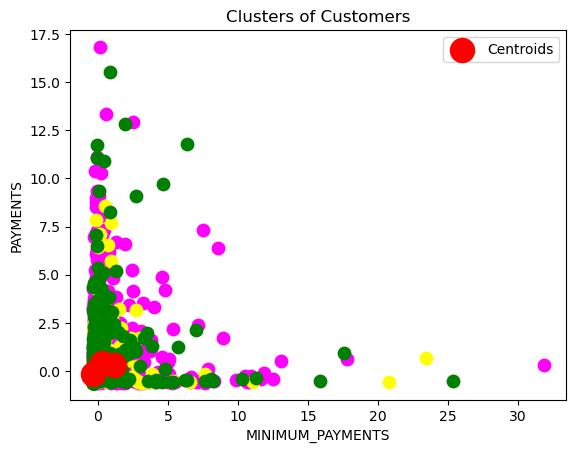

In [7]:
# Standardization 
std=df[:]
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaled_values = scaler.fit_transform(df) 
std.loc[:,:] = scaled_values
from sklearn.cluster import KMeans  #Importing our clustering algorithm: KMeans
kmeans=KMeans(n_clusters=3, random_state=0)  #Cluster our data by choosing 3 as number of clusters
kmeans.fit(std)
labels=pd.DataFrame(kmeans.labels_)
labels
kmeans.predict(std)
print(kmeans.cluster_centers_)   #Printing the coordinates of cluster centers.
std.insert(2,'label', labels[0])
L=["PURCHASES","ONEOFF_PURCHASES","INSTALLMENTS_PURCHASES","PAYMENTS"]
for i in L:
    plt.scatter(std ["MINIMUM_PAYMENTS"][std.label == 0],          
                std[i][std.label == 0],s=80,c='magenta')
    plt.scatter(std ["MINIMUM_PAYMENTS"][std.label == 1],          
                std[i][std.label == 1],s=80,c='yellow')
    plt.scatter(std ["MINIMUM_PAYMENTS"][std.label == 2],          
                std[i][std.label == 2],s=80,c='green')
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red', label = 'Centroids')
    plt.title('Clusters of Customers')
    plt.xlabel("MINIMUM_PAYMENTS")
    plt.ylabel(i)
    plt.legend()
    plt.show()


## 7. Compare the two results. 

Bonus: Search for another validation metric

To Summarize, Hierarchical Clustering has shown 3 distinctive clusters while Kmeans with number of clusters = 3 has failed to demonstrate. 

For the K-means, the Elbow technique couldn't pricise if the optimal number of k=3.

With Hierarchical Clustering, we can divide our customers in 3 groups:

1- customers who pay less expensive purchases with a low minimum_payments

2- customers who pay more expensive purchases with a low minimum_payments

3- customers who pay less expensive purchases with a high minimum_payments 